# Mask R-CNN - Inspect Nucleus Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import nucleus

%matplotlib inline 

# Directory to save logs and trained model
LOGS_DIR = r"G:\DataForDL\logs\mrcnn\nucleus20200319T1125"

D:\Anaconda\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [14]:
# Comment out to reload imported modules if they change
# %load_ext autoreload
# %autoreload 2

## Configurations

In [2]:
# Dataset directory
DATASET_DIR = os.path.join(ROOT_DIR, "datasets/nucleus")

# Inference Configuration
config = nucleus.NucleusInferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        400
DETECTION_MIN_CONFIDENCE       0
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  None
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE               

## Notebook Preferences

In [3]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# Only inference mode is supported right now
TEST_MODE = "inference"

In [4]:
def get_ax(rows=1, cols=1, size=5):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    return ax

## Load Validation Dataset

In [5]:
# Load validation dataset
dataset = nucleus.NucleusDataset()
dataset.load_nucleus(DATASET_DIR, "val")
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 19
Classes: ['BG', 'nucleus']


## Load Model

In [19]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference",
                              model_dir=LOGS_DIR,
                              config=config)

In [20]:
# Path to a specific weights file
weights_path = os.path.join(LOGS_DIR, "mask_rcnn_nucleus_0040.h5")

# Or, load the last model you trained
# weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  G:\DataForDL\logs\mrcnn\nucleus20200319T1125\mask_rcnn_nucleus_0040.h5
Re-starting from epoch 40


# Grabcut Mask

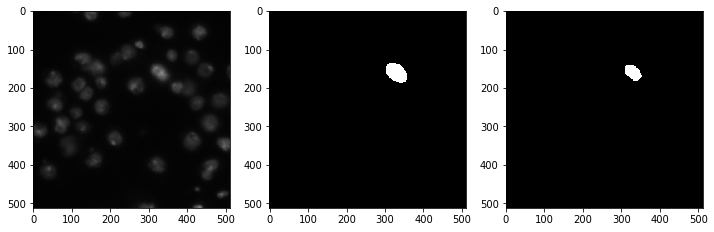

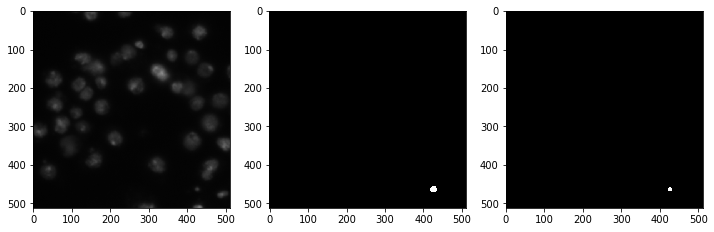

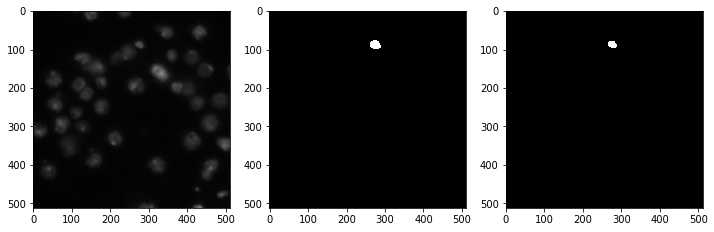

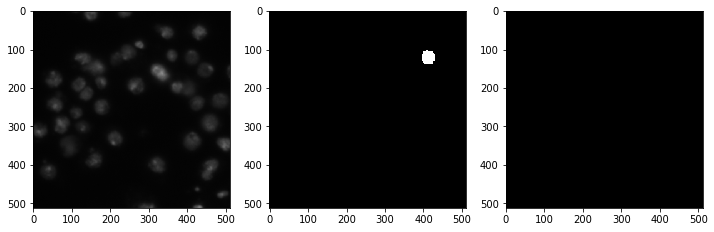

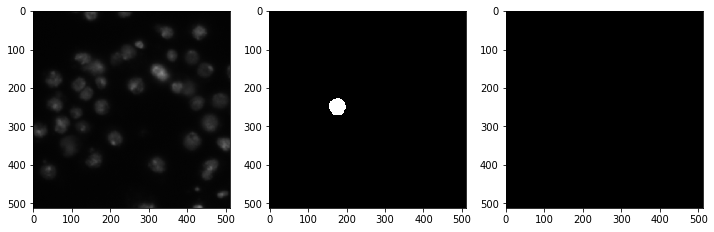

...

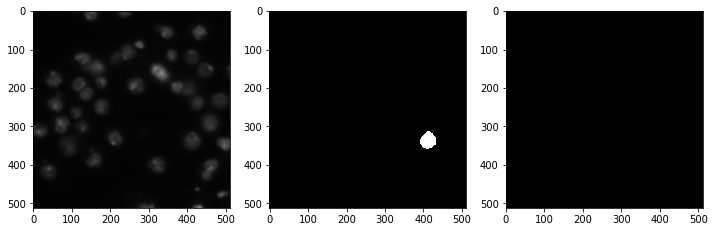

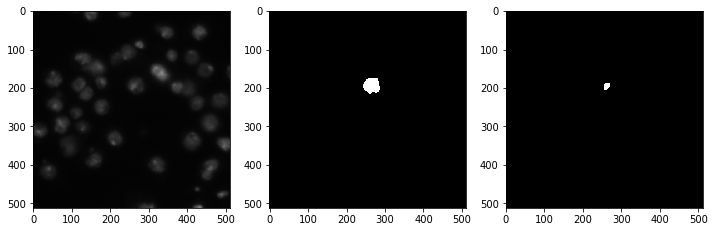

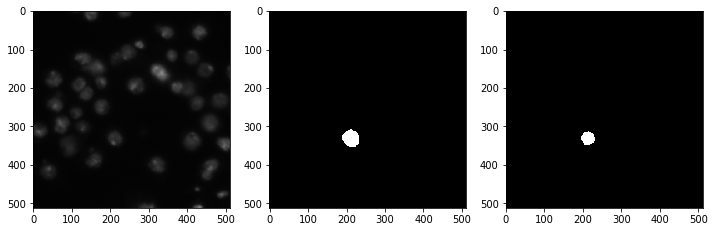

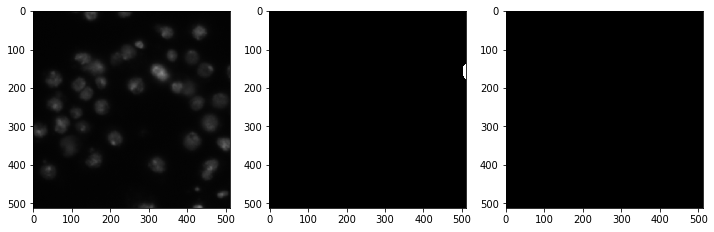

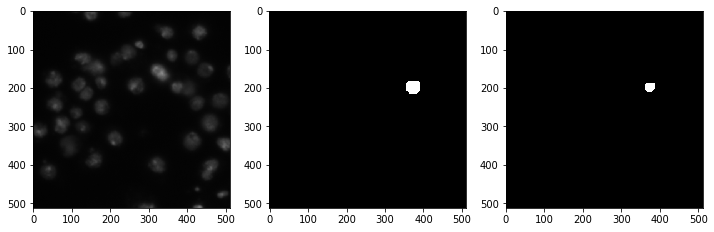

In [7]:
# single mask outout
image_id = 0
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)


masks = utils.bbox2mask(gt_bbox, image)

for idx in range(gt_bbox.shape[0]):
    _, axes = plt.subplots(1,3, figsize=(12,6))
    axes[0].imshow(image, cmap="gray")
    axes[1].imshow(gt_mask[:,:,idx], cmap='gray')
    axes[2].imshow(masks[:,:,idx], cmap='gray')
    plt.show()

In [8]:
gt_bbox.shape[0], np.bincount(np.sum(masks, axis=(0,1))>0)

(44, array([21, 23], dtype=int64))

## Run Detection

image ID: nucleus.0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2 (0) 0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   20.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   20.00000  max:  245.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


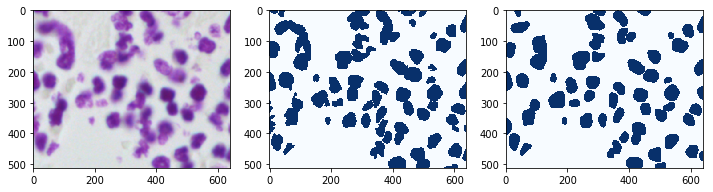

image ID: nucleus.92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7 (1) 92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   30.00000  max:  232.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   30.00000  max:  232.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


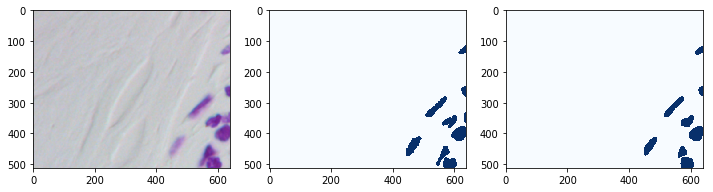

image ID: nucleus.1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f (2) 1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  215.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:    0.00000  max:  215.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


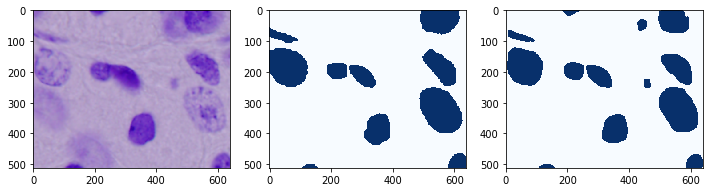

image ID: nucleus.c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339 (3) c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339
Original image shape:  [1040 1388    3]
Processing 1 images
image                    shape: (2112, 2816, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 2112, 2816, 3)    min:    0.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    1.00000  max: 2816.00000  float64
anchors                  shape: (1, 1485396, 4)       min:   -0.04288  max:    1.01256  float32


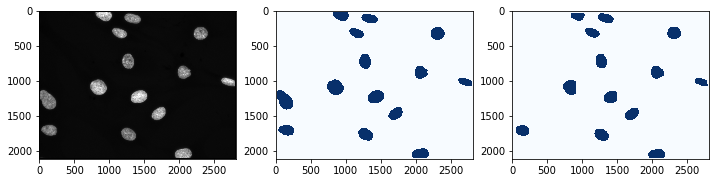

image ID: nucleus.8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b (4) 8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   32.00000  max:  212.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   32.00000  max:  212.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


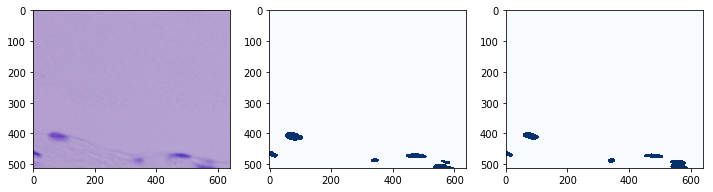

image ID: nucleus.60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff (5) 60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    8.00000  max:   90.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    8.00000  max:   90.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


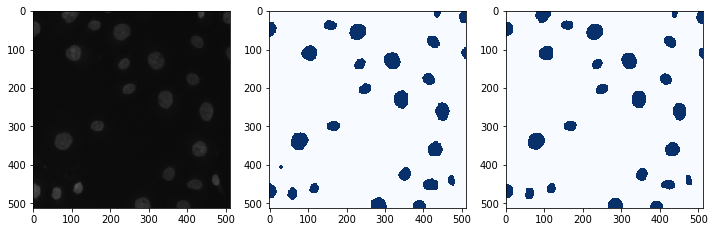

image ID: nucleus.da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844 (6) da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844
Original image shape:  [520 696   3]
Processing 1 images
image                    shape: (1088, 1408, 3)       min:    0.00000  max:  220.00000  uint8
molded_images            shape: (1, 1088, 1408, 3)    min:    0.00000  max:  220.00000  uint8
image_metas              shape: (1, 14)               min:    1.00000  max: 1408.00000  float64
anchors                  shape: (1, 382602, 4)        min:   -0.08327  max:    1.02439  float32


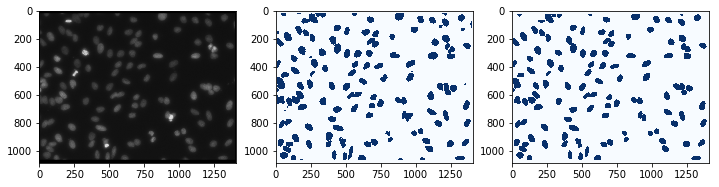

image ID: nucleus.9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32 (7) 9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    3.00000  max:  152.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:    3.00000  max:  152.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


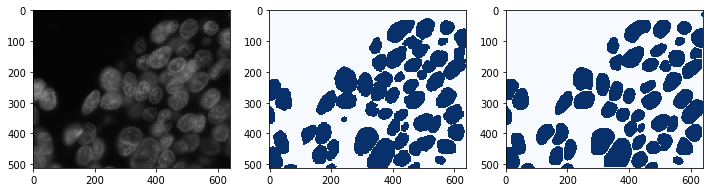

image ID: nucleus.1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df (8) 1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df
Original image shape:  [1024 1024    3]
Processing 1 images
image                    shape: (2048, 2048, 3)       min:   48.00000  max:  251.00000  uint8
molded_images            shape: (1, 2048, 2048, 3)    min:   48.00000  max:  251.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max: 2048.00000  float64
anchors                  shape: (1, 1047552, 4)       min:   -0.04422  max:    1.01295  float32


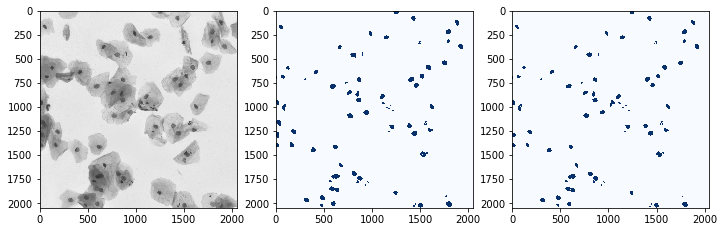

image ID: nucleus.97126a9791f0c1176e4563ad679a301dac27c59011f579e808bbd6e9f4cd1034 (9) 97126a9791f0c1176e4563ad679a301dac27c59011f579e808bbd6e9f4cd1034
Original image shape:  [360 360   3]
Processing 1 images
image                    shape: (768, 768, 3)         min:    0.00000  max:   34.00000  uint8
molded_images            shape: (1, 768, 768, 3)      min:    0.00000  max:   34.00000  uint8
image_metas              shape: (1, 14)               min:    1.00000  max:  768.00000  float64
anchors                  shape: (1, 147312, 4)        min:   -0.11800  max:    1.03456  float32


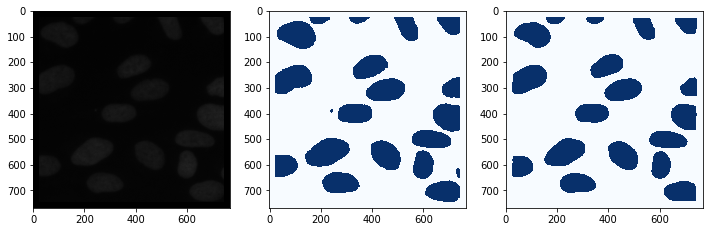

image ID: nucleus.e81c758e1ca177b0942ecad62cf8d321ffc315376135bcbed3df932a6e5b40c0 (10) e81c758e1ca177b0942ecad62cf8d321ffc315376135bcbed3df932a6e5b40c0
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    2.00000  max:  123.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    2.00000  max:  123.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


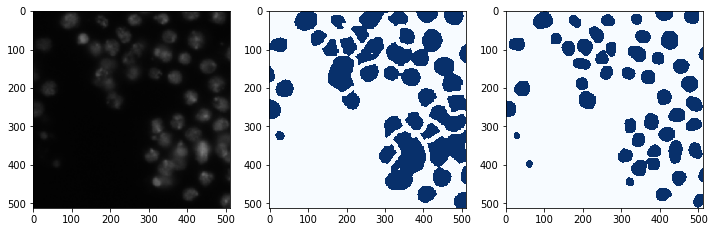

image ID: nucleus.f29fd9c52e04403cd2c7d43b6fe2479292e53b2f61969d25256d2d2aca7c6a81 (11) f29fd9c52e04403cd2c7d43b6fe2479292e53b2f61969d25256d2d2aca7c6a81
Original image shape:  [ 603 1272    3]
Processing 1 images
image                    shape: (1216, 2560, 3)       min:    0.00000  max:  149.00000  uint8
molded_images            shape: (1, 1216, 2560, 3)    min:    0.00000  max:  149.00000  uint8
image_metas              shape: (1, 14)               min:    1.00000  max: 2560.00000  float64
anchors                  shape: (1, 777480, 4)        min:   -0.07449  max:    1.02182  float32


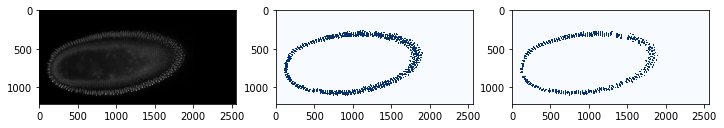

image ID: nucleus.0ea221716cf13710214dcd331a61cea48308c3940df1d28cfc7fd817c83714e1 (12) 0ea221716cf13710214dcd331a61cea48308c3940df1d28cfc7fd817c83714e1
Original image shape:  [520 696   3]
Processing 1 images
image                    shape: (1088, 1408, 3)       min:    0.00000  max:  239.00000  uint8
molded_images            shape: (1, 1088, 1408, 3)    min:    0.00000  max:  239.00000  uint8
image_metas              shape: (1, 14)               min:    1.00000  max: 1408.00000  float64
anchors                  shape: (1, 382602, 4)        min:   -0.08327  max:    1.02439  float32


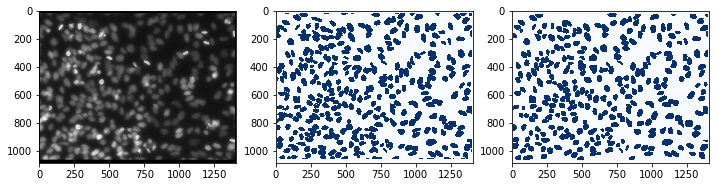

image ID: nucleus.3ab9cab6212fabd723a2c5a1949c2ded19980398b56e6080978e796f45cbbc90 (13) 3ab9cab6212fabd723a2c5a1949c2ded19980398b56e6080978e796f45cbbc90
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   10.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   10.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


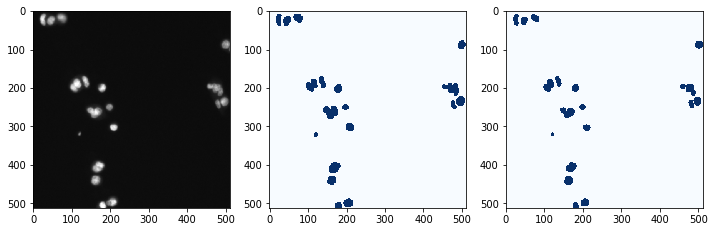

image ID: nucleus.ebc18868864ad075548cc1784f4f9a237bb98335f9645ee727dac8332a3e3716 (14) ebc18868864ad075548cc1784f4f9a237bb98335f9645ee727dac8332a3e3716
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  213.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:    0.00000  max:  213.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


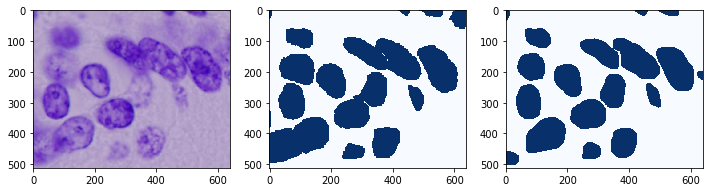

image ID: nucleus.bb61fc17daf8bdd4e16fdcf50137a8d7762bec486ede9249d92e511fcb693676 (15) bb61fc17daf8bdd4e16fdcf50137a8d7762bec486ede9249d92e511fcb693676
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   24.00000  max:  237.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   24.00000  max:  237.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


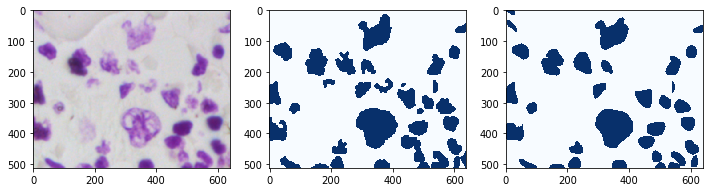

image ID: nucleus.e1bcb583985325d0ef5f3ef52957d0371c96d4af767b13e48102bca9d5351a9b (16) e1bcb583985325d0ef5f3ef52957d0371c96d4af767b13e48102bca9d5351a9b
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   10.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   10.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


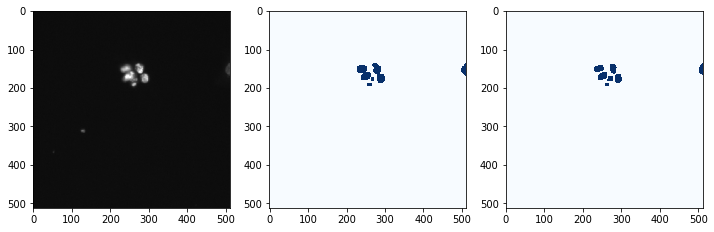

image ID: nucleus.947c0d94c8213ac7aaa41c4efc95d854246550298259cf1bb489654d0e969050 (17) 947c0d94c8213ac7aaa41c4efc95d854246550298259cf1bb489654d0e969050
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   25.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   25.00000  max:  245.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


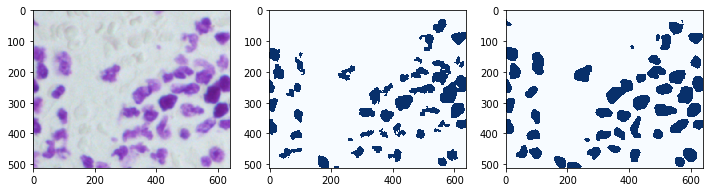

image ID: nucleus.cbca32daaae36a872a11da4eaff65d1068ff3f154eedc9d3fc0c214a4e5d32bd (18) cbca32daaae36a872a11da4eaff65d1068ff3f154eedc9d3fc0c214a4e5d32bd
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  217.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:    0.00000  max:  217.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


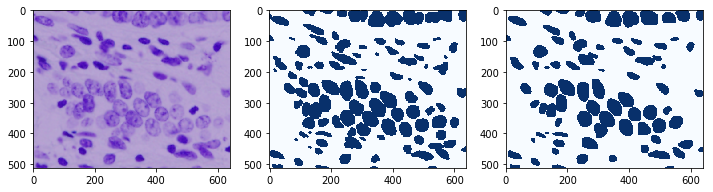

image ID: nucleus.f4c4db3df4ff0de90f44b027fc2e28c16bf7e5c75ea75b0a9762bbb7ac86e7a3 (19) f4c4db3df4ff0de90f44b027fc2e28c16bf7e5c75ea75b0a9762bbb7ac86e7a3
Original image shape:  [ 603 1272    3]
Processing 1 images
image                    shape: (1216, 2560, 3)       min:    0.00000  max:  113.00000  uint8
molded_images            shape: (1, 1216, 2560, 3)    min:    0.00000  max:  113.00000  uint8
image_metas              shape: (1, 14)               min:    1.00000  max: 2560.00000  float64
anchors                  shape: (1, 777480, 4)        min:   -0.07449  max:    1.02182  float32


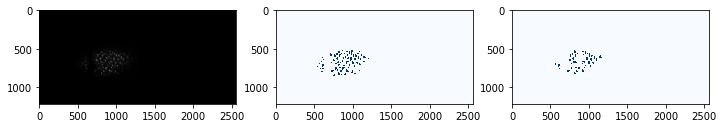

image ID: nucleus.4193474b2f1c72f735b13633b219d9cabdd43c21d9c2bb4dfc4809f104ba4c06 (20) 4193474b2f1c72f735b13633b219d9cabdd43c21d9c2bb4dfc4809f104ba4c06
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    1.00000  max:  229.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:    1.00000  max:  229.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


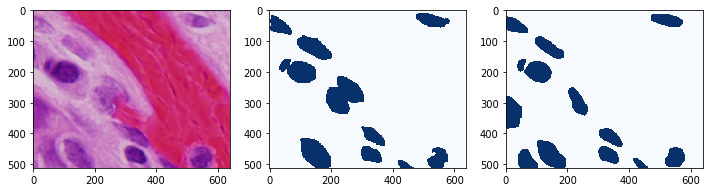

image ID: nucleus.f73e37957c74f554be132986f38b6f1d75339f636dfe2b681a0cf3f88d2733af (21) f73e37957c74f554be132986f38b6f1d75339f636dfe2b681a0cf3f88d2733af
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  139.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  139.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


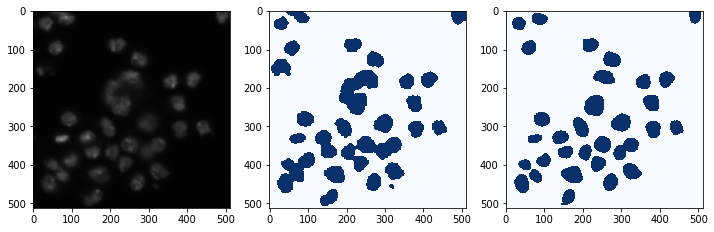

image ID: nucleus.a4c44fc5f5bf213e2be6091ccaed49d8bf039d78f6fbd9c4d7b7428cfcb2eda4 (22) a4c44fc5f5bf213e2be6091ccaed49d8bf039d78f6fbd9c4d7b7428cfcb2eda4
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   15.00000  max:  238.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   15.00000  max:  238.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  float64
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


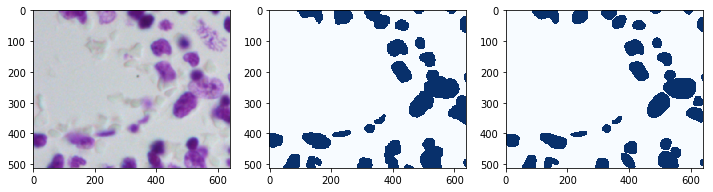

image ID: nucleus.cab4875269f44a701c5e58190a1d2f6fcb577ea79d842522dcab20ccb39b7ad2 (23) cab4875269f44a701c5e58190a1d2f6fcb577ea79d842522dcab20ccb39b7ad2
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  153.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  153.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


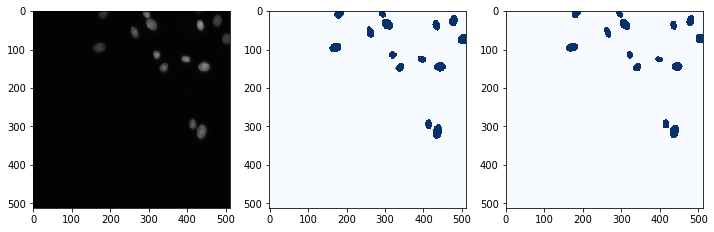

image ID: nucleus.8ecdb93582b2d5270457b36651b62776256ade3aaa2d7432ae65c14f07432d49 (24) 8ecdb93582b2d5270457b36651b62776256ade3aaa2d7432ae65c14f07432d49
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    8.00000  max:  138.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:    8.00000  max:  138.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


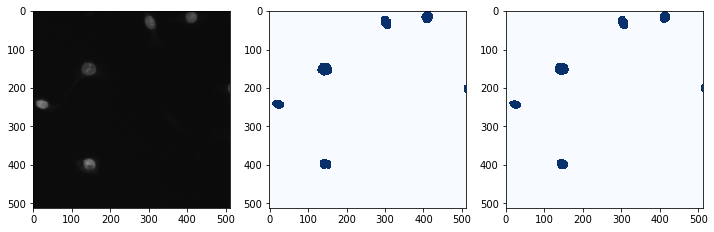

In [12]:
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))
    print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

    # Run object detection
    results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)

    # Display results
    r = results[0]
    _, axes = plt.subplots(1,3, figsize=(12,6))
    axes[0].imshow(image)
    axes[1].imshow(gt_mask.sum(axis=-1), cmap='Blues')
    axes[2].imshow(np.where(r['masks'].sum(axis=-1)==0, 0, 1), cmap='Blues')
    plt.show()

image ID: nucleus.0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2 (0) 0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   20.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:  -19.56000  max:  197.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


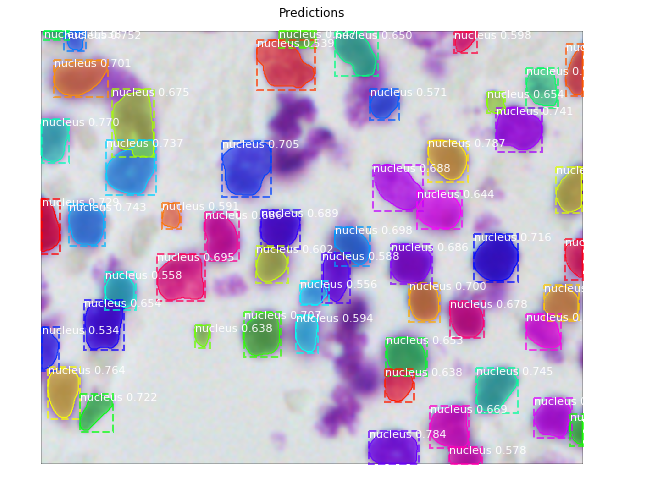

image ID: nucleus.92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7 (1) 92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   30.00000  max:  232.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   -9.56000  max:  183.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


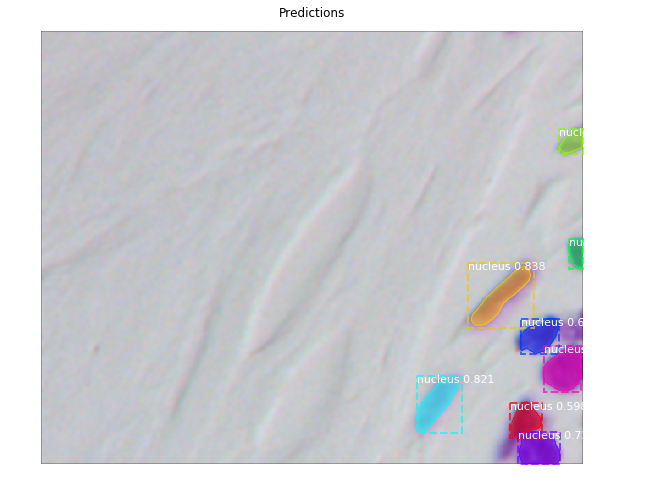

image ID: nucleus.1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f (2) 1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  215.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:  -39.56000  max:  166.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


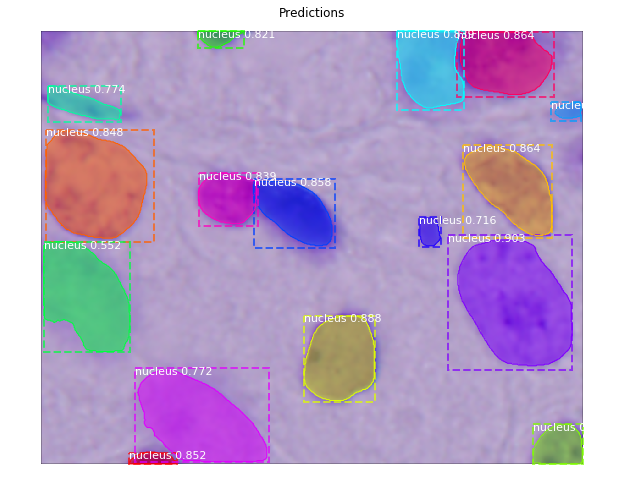

image ID: nucleus.c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339 (3) c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339
Original image shape:  [1040 1388    3]
Processing 1 images
image                    shape: (1088, 1408, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1088, 1408, 3)    min:  -48.22000  max:  215.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1408.00000  int32
anchors                  shape: (1, 382602, 4)        min:   -0.08327  max:    1.02439  float32


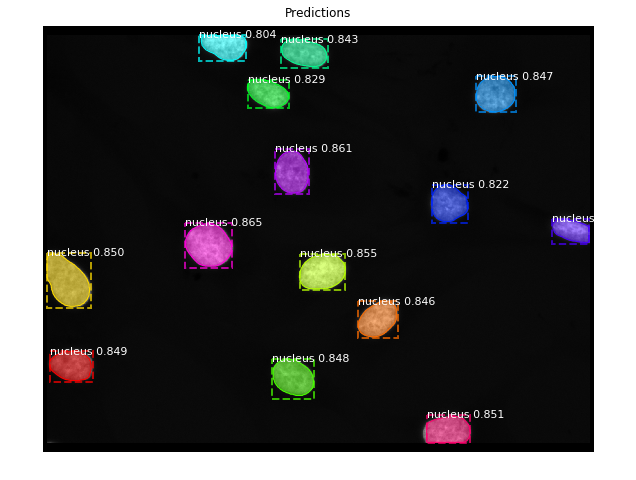

image ID: nucleus.8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b (4) 8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   32.00000  max:  212.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   -7.56000  max:  163.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


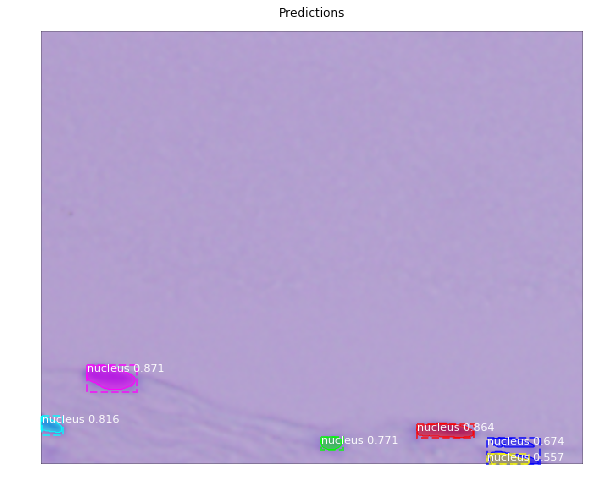

image ID: nucleus.60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff (5) 60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    8.00000  max:   90.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -40.22000  max:   50.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


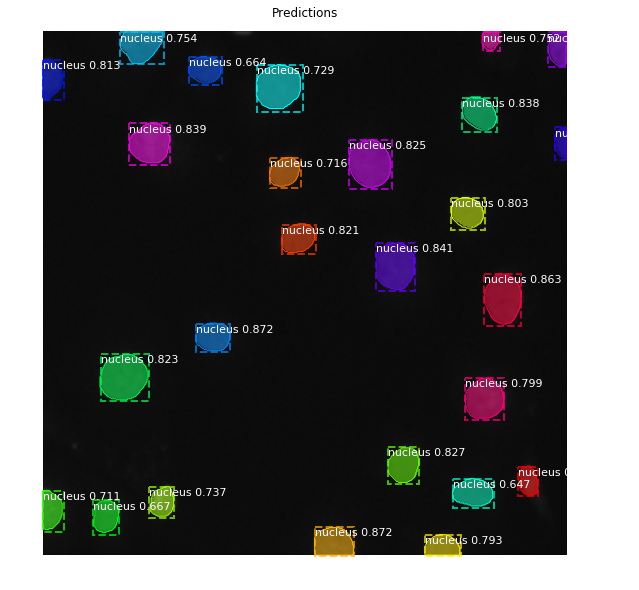

image ID: nucleus.da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844 (6) da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844
Original image shape:  [520 696   3]
Processing 1 images
image                    shape: (576, 704, 3)         min:    0.00000  max:  221.00000  uint8
molded_images            shape: (1, 576, 704, 3)      min:  -48.22000  max:  181.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  704.00000  int32
anchors                  shape: (1, 101277, 4)        min:   -0.15741  max:    1.04610  float32


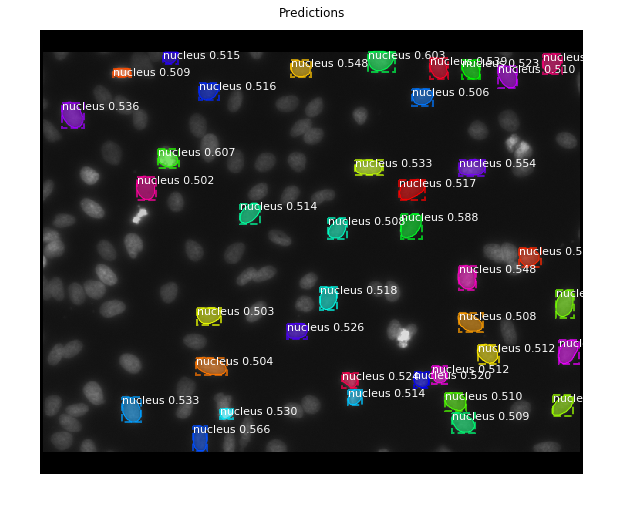

image ID: nucleus.9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32 (7) 9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    3.00000  max:  152.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:  -45.22000  max:  112.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32


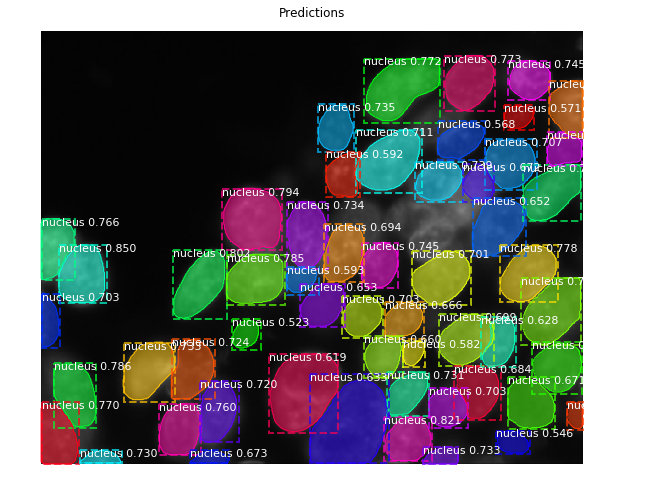

image ID: nucleus.1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df (8) 1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df
Original image shape:  [1024 1024    3]
Processing 1 images
image                    shape: (1024, 1024, 3)       min:   48.00000  max:  254.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min:   -0.22000  max:  214.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


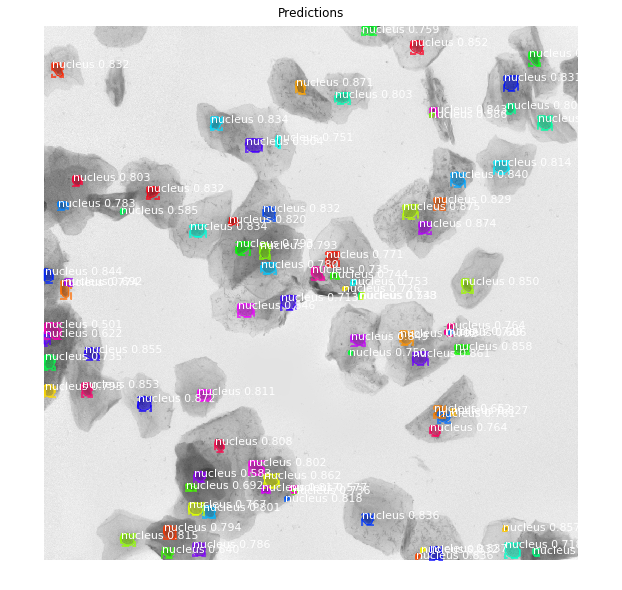

image ID: nucleus.97126a9791f0c1176e4563ad679a301dac27c59011f579e808bbd6e9f4cd1034 (9) 97126a9791f0c1176e4563ad679a301dac27c59011f579e808bbd6e9f4cd1034
Original image shape:  [360 360   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    2.00000  max:   34.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -46.22000  max:   -5.56000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


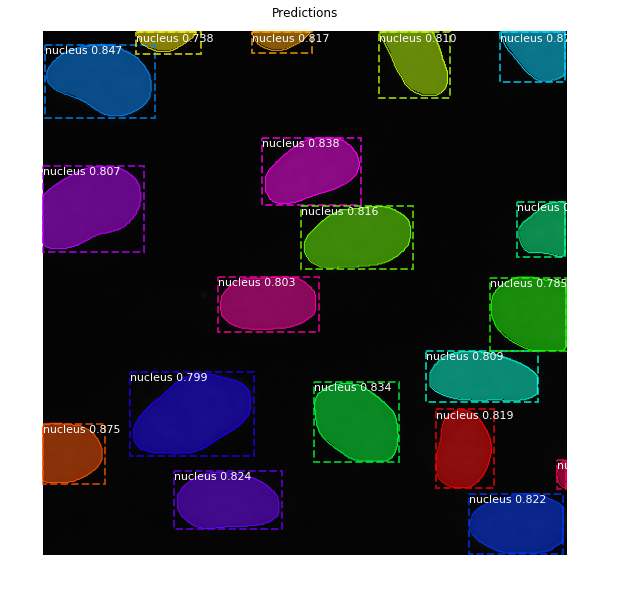

image ID: nucleus.e81c758e1ca177b0942ecad62cf8d321ffc315376135bcbed3df932a6e5b40c0 (10) e81c758e1ca177b0942ecad62cf8d321ffc315376135bcbed3df932a6e5b40c0
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    2.00000  max:  123.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -46.22000  max:   83.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


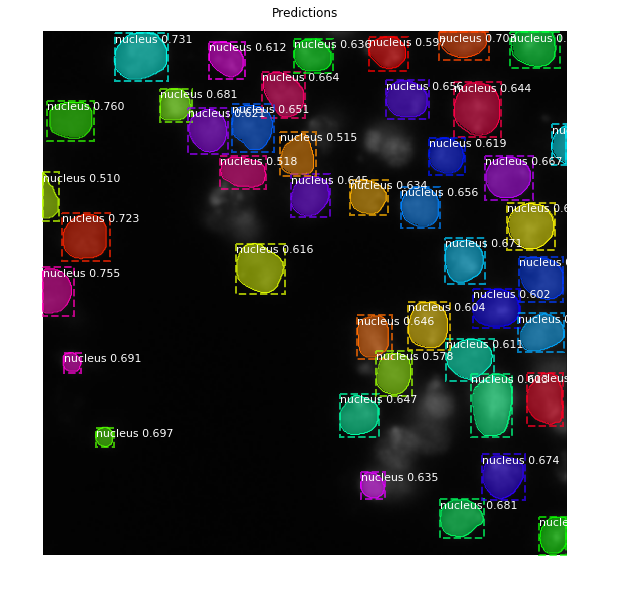

In [9]:
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))
    print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], figsize=(10,10),
                                title="Predictions" )
    plt.show()
    if image_id>=10:
        break

image ID: nucleus.0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2 (0) 0c2550a23b8a0f29a7575de8c61690d3c31bc897dd5ba66caec201d201a278c2
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   20.00000  max:  245.00000  uint8
molded_images            shape: (1, 1024, 1280, 3)    min:  -19.56000  max:  197.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 327360, 4)        min:   -0.08847  max:    1.02591  float32


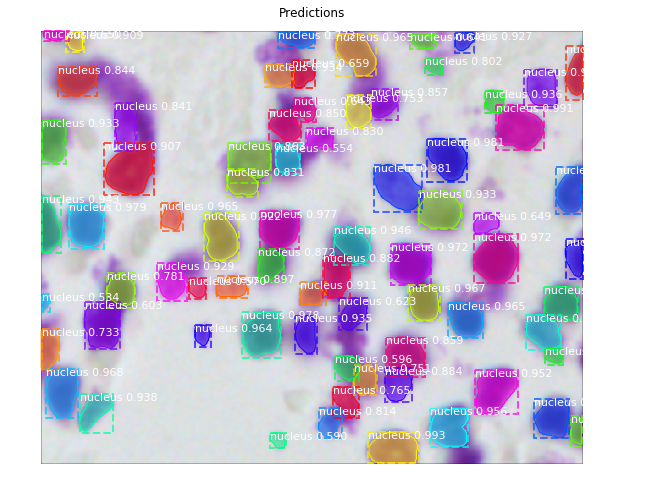

image ID: nucleus.92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7 (1) 92f31f591929a30e4309ab75185c96ff4314ce0a7ead2ed2c2171897ad1da0c7
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   30.00000  max:  232.00000  uint8
molded_images            shape: (1, 1024, 1280, 3)    min:   -9.56000  max:  182.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 327360, 4)        min:   -0.08847  max:    1.02591  float32


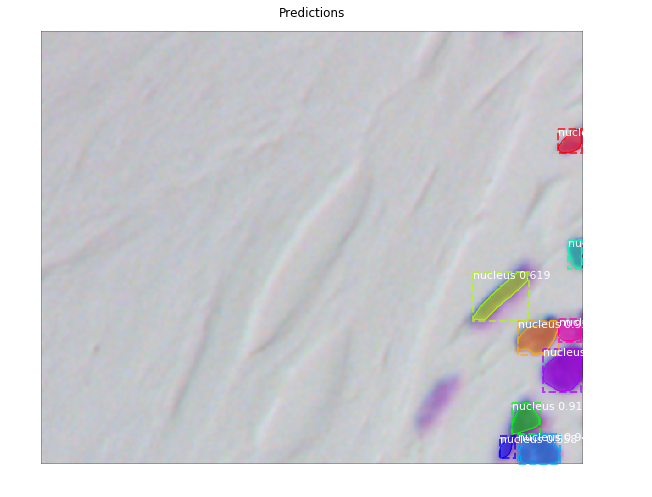

image ID: nucleus.1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f (2) 1e488c42eb1a54a3e8412b1f12cde530f950f238d71078f2ede6a85a02168e1f
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  215.00000  uint8
molded_images            shape: (1, 1024, 1280, 3)    min:  -39.56000  max:  165.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 327360, 4)        min:   -0.08847  max:    1.02591  float32


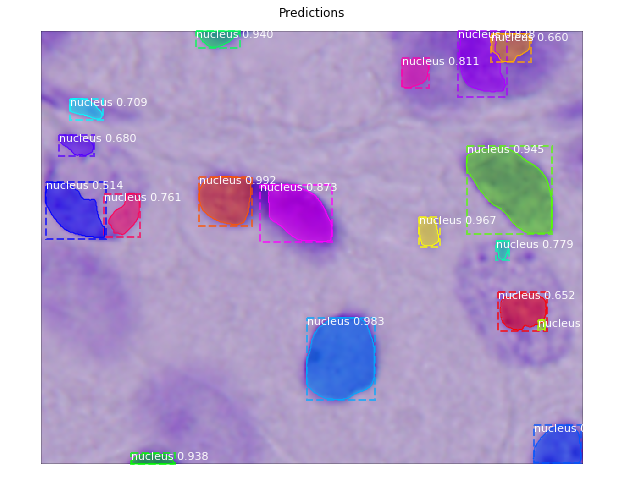

image ID: nucleus.c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339 (3) c901794d1a421d52e5734500c0a2a8ca84651fb93b19cec2f411855e70cae339
Original image shape:  [1040 1388    3]
Processing 1 images
image                    shape: (2112, 2816, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 4224, 5632, 3)    min:  -48.22000  max:  215.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 5632.00000  float64
anchors                  shape: (1, 5941584, 4)       min:   -0.02143  max:    1.00628  float32


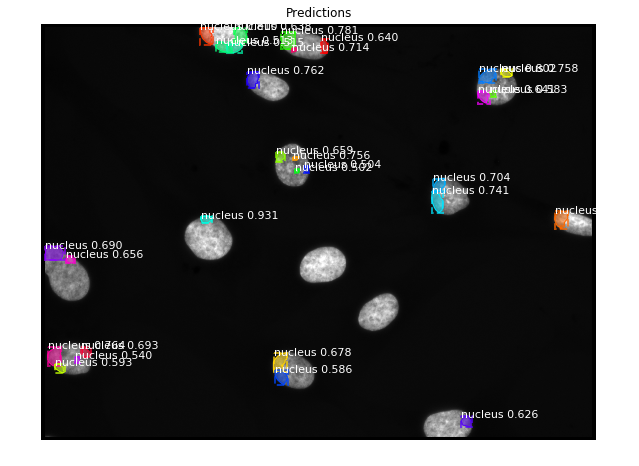

image ID: nucleus.8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b (4) 8e507d58f4c27cd2a82bee79fe27b069befd62a46fdaed20970a95a2ba819c7b
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:   32.00000  max:  212.00000  uint8
molded_images            shape: (1, 1024, 1280, 3)    min:   -7.56000  max:  163.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 327360, 4)        min:   -0.08847  max:    1.02591  float32


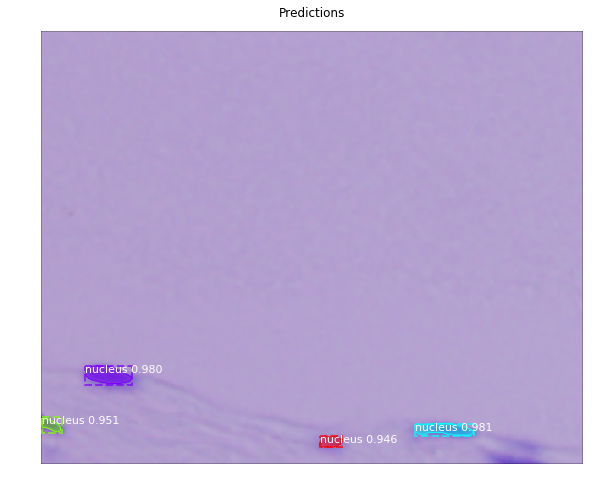

image ID: nucleus.60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff (5) 60cb718759bff13f81c4055a7679e81326f78b6a193a2d856546097c949b20ff
Original image shape:  [256 256   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:    8.00000  max:   90.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min:  -40.22000  max:   49.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.08847  max:    1.02591  float32


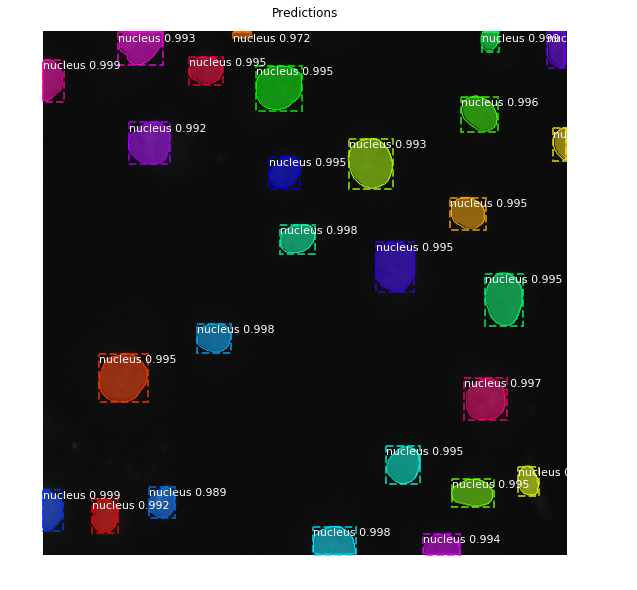

image ID: nucleus.da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844 (6) da5f98f2b8a64eee735a398de48ed42cd31bf17a6063db46a9e0783ac13cd844
Original image shape:  [520 696   3]
Processing 1 images
image                    shape: (1088, 1408, 3)       min:    0.00000  max:  220.00000  uint8
molded_images            shape: (1, 2176, 2816, 3)    min:  -48.22000  max:  180.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 2816.00000  float64
anchors                  shape: (1, 1530408, 4)       min:   -0.04161  max:    1.01219  float32


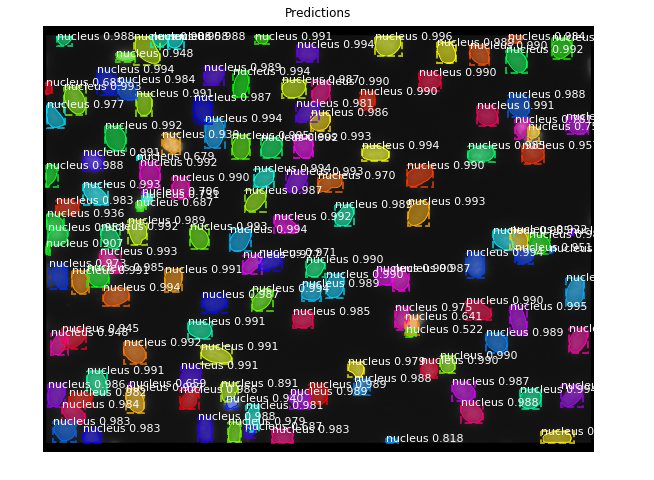

image ID: nucleus.9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32 (7) 9ebcfaf2322932d464f15b5662cae4d669b2d785b8299556d73fffcae8365d32
Original image shape:  [256 320   3]
Processing 1 images
image                    shape: (512, 640, 3)         min:    3.00000  max:  152.00000  uint8
molded_images            shape: (1, 1024, 1280, 3)    min:  -45.22000  max:  111.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  float64
anchors                  shape: (1, 327360, 4)        min:   -0.08847  max:    1.02591  float32


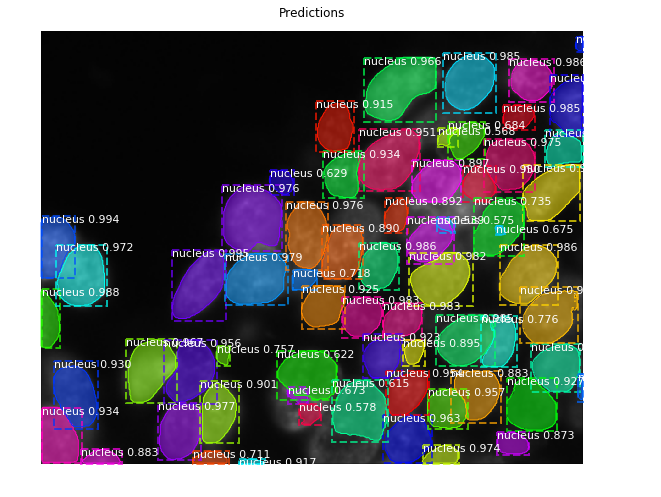

image ID: nucleus.1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df (8) 1b44d22643830cd4f23c9deadb0bd499fb392fb2cd9526d81547d93077d983df
Original image shape:  [1024 1024    3]
Processing 1 images
image                    shape: (2048, 2048, 3)       min:   48.00000  max:  251.00000  uint8
molded_images            shape: (1, 4096, 4096, 3)    min:   -0.22000  max:  210.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 4096.00000  float64
anchors                  shape: (1, 4190208, 4)       min:   -0.02210  max:    1.00647  float32


KeyboardInterrupt: 

In [26]:
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))
    print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], figsize=(10,10),
                                title="Predictions" )
    plt.show()
    if image_id>=10:
        break

In [10]:
def compute_mask_iou(gt_mask, pred_mask):
    intersect = np.sum(gt_mask*pred_mask)
    union = gt_mask.sum()+pred_mask.sum()-intersect
    return intersect*1./union

In [21]:
# compute iou of mrcnn on nucleus
iou, APs = [], []
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
#     info = dataset.image_info[image_id]
    # print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, dataset.image_reference(image_id)))
    # Run object detection
    results = model.detect([image], verbose=1)
    r = results[0]

    union_mask_label = np.where(gt_mask.sum(axis=-1)==0, 0, 1)
    union_mask_pred = np.where(r['masks'].sum(axis=-1)==0, 0, 1)
    iou.append(compute_mask_iou(union_mask_label, union_mask_pred))
    
    ap = utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                           r['rois'], r['class_ids'], r['scores'], r['masks'],
                           verbose=0)
    APs.append(ap)
    print(iou[-1], APs[-1])
    del results, r, gt_mask, gt_bbox, image

Processing 1 images
image                    shape: (512, 640, 3)         min:   20.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:  -19.56000  max:  197.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32
0.7894202537944762 0.5034042006951644
Processing 1 images
image                    shape: (512, 640, 3)         min:   30.00000  max:  232.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:   -9.56000  max:  183.78000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32
0.7942453854505972 0.46891667264203224
Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  215.00000  uint8
molded_im

0.7660109478117993 0.4835139104215832
Processing 1 images
image                    shape: (640, 1280, 3)        min:    0.00000  max:  117.00000  uint8
molded_images            shape: (1, 640, 1280, 3)     min:  -48.22000  max:   77.44000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1280.00000  int32
anchors                  shape: (1, 204600, 4)        min:   -0.14164  max:    1.04149  float32
0.5283958817668548 0.22669537941749743
Processing 1 images
image                    shape: (512, 640, 3)         min:    1.00000  max:  229.00000  uint8
molded_images            shape: (1, 512, 640, 3)      min:  -38.56000  max:  185.47000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  640.00000  int32
anchors                  shape: (1, 81840, 4)         min:   -0.17712  max:    1.05188  float32
0.662679209033404 0.5798941807354254
Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00

In [22]:
# no scale, 100ins + 40heads only
np.mean(iou), np.mean(APs)

(0.776790404775741, 0.5453595754054998)

In [12]:
# no scale, 50ins + 20all
np.mean(iou), np.mean(APs)

(0.6752640488789765, 0.487630652429112)

In [23]:
# scale 2, 100ins + 40heads training only
np.mean(iou), np.mean(APs)

(0.6733430374178694, 0.43075951777798543)

In [11]:
# scale 2, 50ins + 20 all 
np.mean(iou), np.mean(APs)

(0.6916569888972632, 0.4361137954375631)

### Compute AP on Batch of Images

In [12]:
def compute_batch_ap(dataset, image_ids, verbose=1):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect_molded(image[np.newaxis], image_meta[np.newaxis], verbose=0)
        # Compute AP over range 0.5 to 0.95
        r = results[0]
        ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
        APs.append(ap)
        if verbose:
            info = dataset.image_info[image_id]
            meta = modellib.parse_image_meta(image_meta[np.newaxis,...])
            print("{:3} {}   AP: {:.2f}".format(
                meta["image_id"][0], meta["original_image_shape"][0], ap))
    return APs

# Run on validation set
limit = 5
APs = compute_batch_ap(dataset, dataset.image_ids[:limit])
print("Mean AP overa {} images: {:.4f}".format(len(APs), np.mean(APs)))

  0 [256 320   3]   AP: 0.41
  1 [256 320   3]   AP: 0.44
  2 [256 320   3]   AP: 0.69
  3 [1040 1388    3]   AP: 0.74
  4 [256 320   3]   AP: 0.33
Mean AP overa 5 images: 0.5215


## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [13]:
# Get anchors and convert to pixel coordinates
anchors = model.get_anchors(image.shape)
anchors = utils.denorm_boxes(anchors, image.shape[:2])
log("anchors", anchors)

# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = anchors[positive_anchor_ix]
negative_anchors = anchors[negative_anchor_ix]
neutral_anchors = anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

anchors                  shape: (81840, 4)            min:  -91.00000  max:  667.00000  int32
target_rpn_match         shape: (81840,)              min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (64, 4)               min:   -2.60870  max:    2.50000  float64
positive_anchors         shape: (12, 4)               min:    0.00000  max:  589.00000  int32
negative_anchors         shape: (52, 4)               min:   -2.00000  max:  642.00000  int32
neutral anchors          shape: (81776, 4)            min:  -91.00000  max:  667.00000  int32
refined_anchors          shape: (12, 4)               min:    4.00000  max:  588.00000  float32


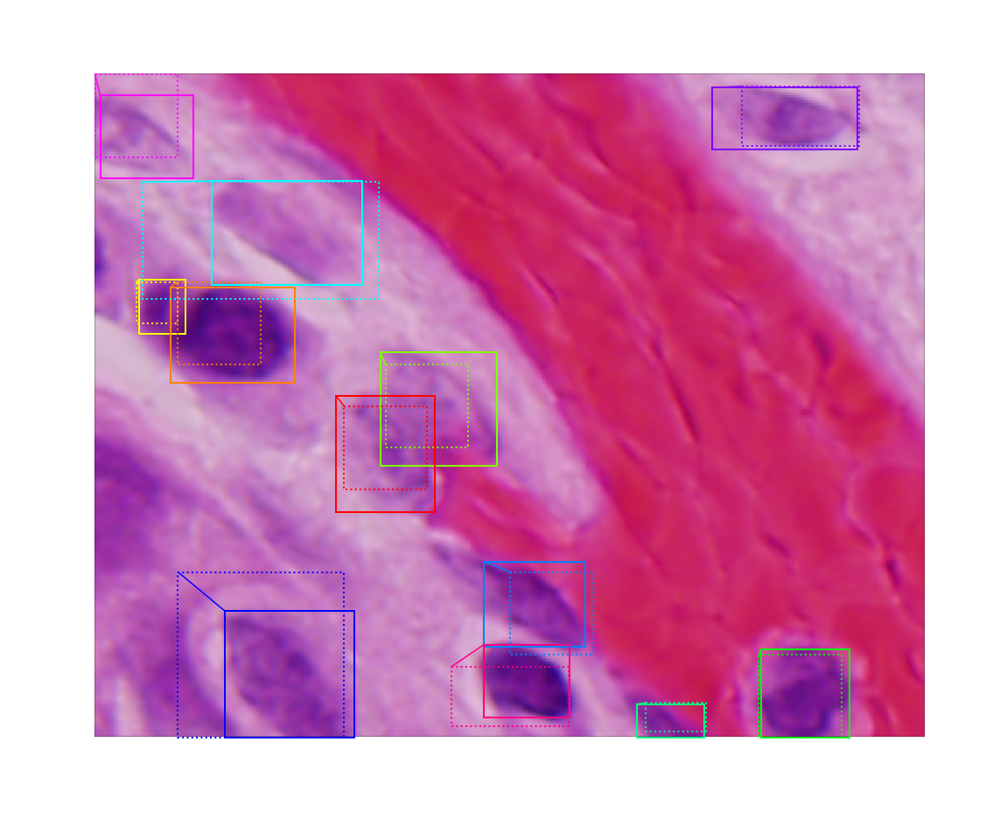

In [14]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=positive_anchors,
    refined_boxes=refined_anchors)

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [15]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph(image[np.newaxis], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
], image_metas=image_meta[np.newaxis])

rpn_class                shape: (1, 81840, 2)         min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.17712  max:    1.05188  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.15117  max:    1.23829  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (2000,)               min:    0.00000  max: 2684.00000  int32
proposals                shape: (1, 2000, 4)          min:    0.00000  max:    1.00000  float32


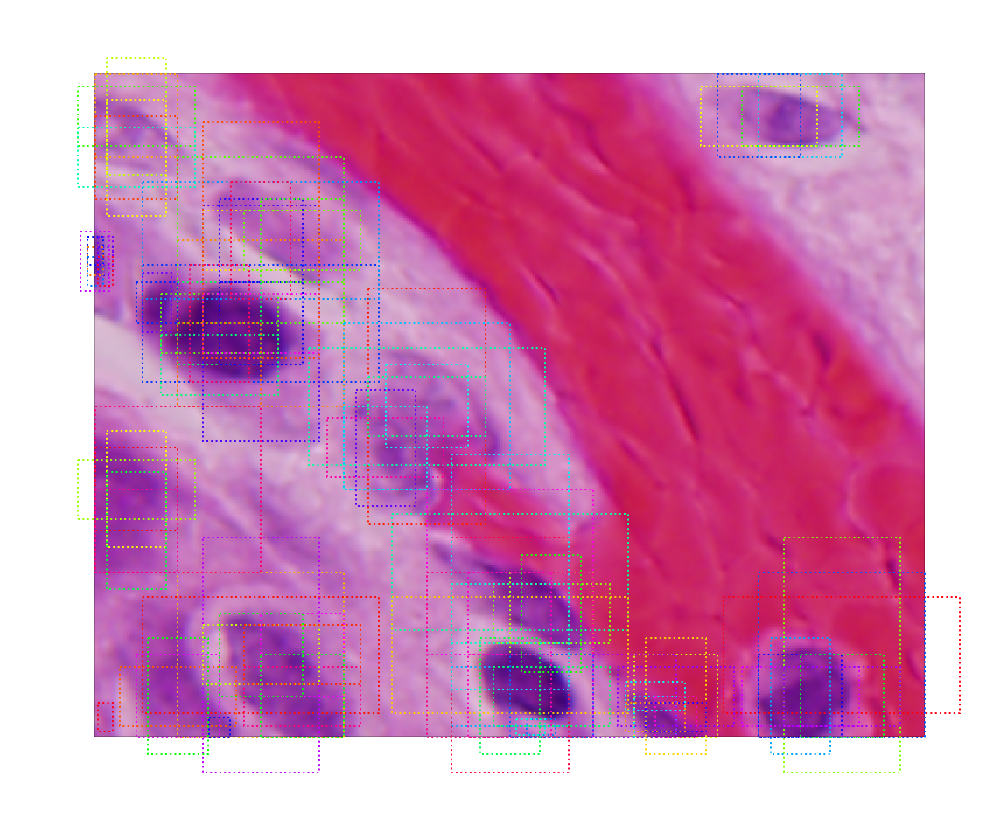

In [16]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=anchors[sorted_anchor_ids[:limit]], ax=get_ax())

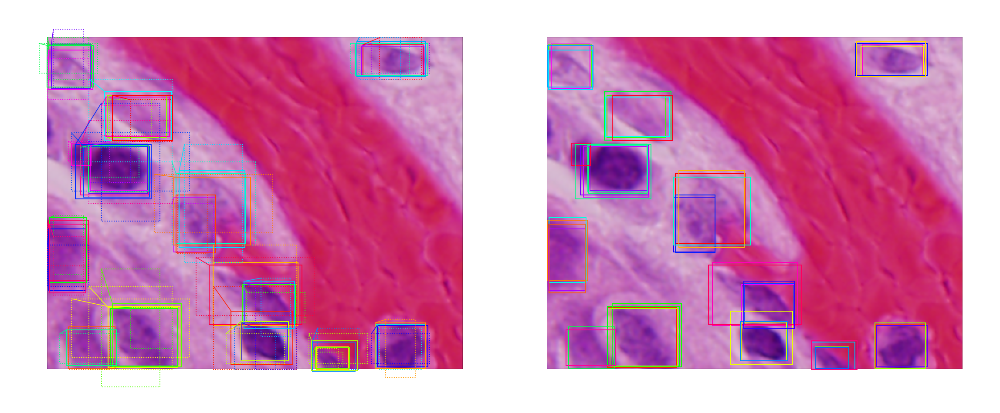

In [17]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

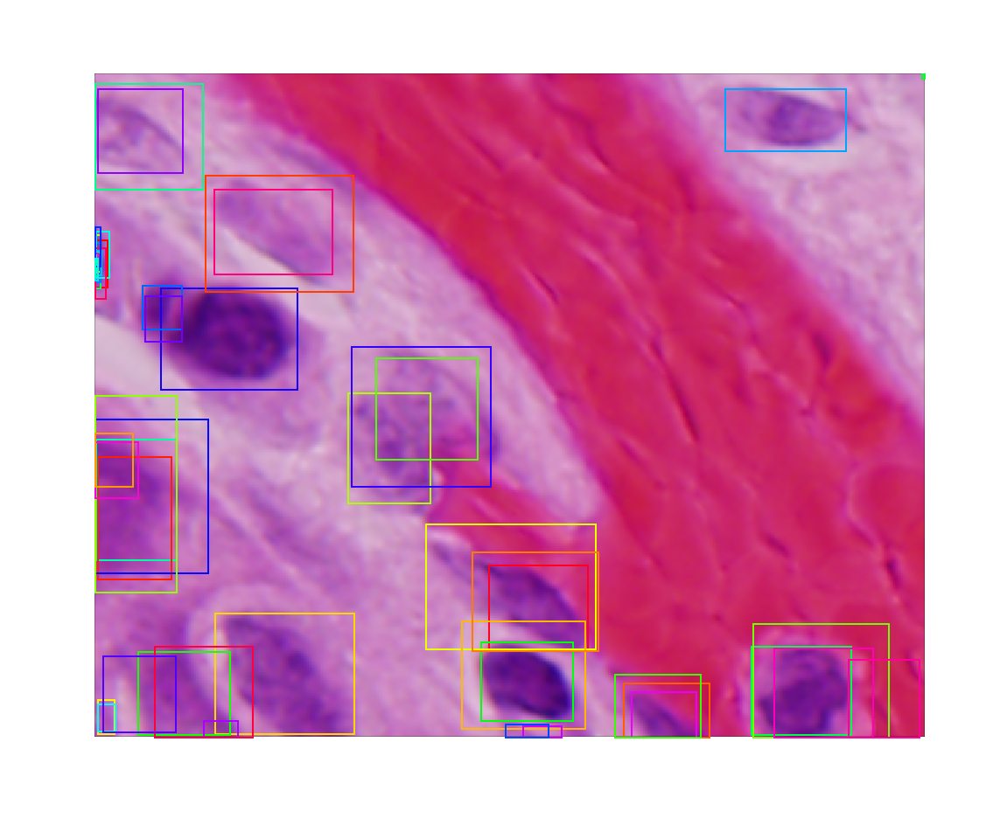

In [18]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

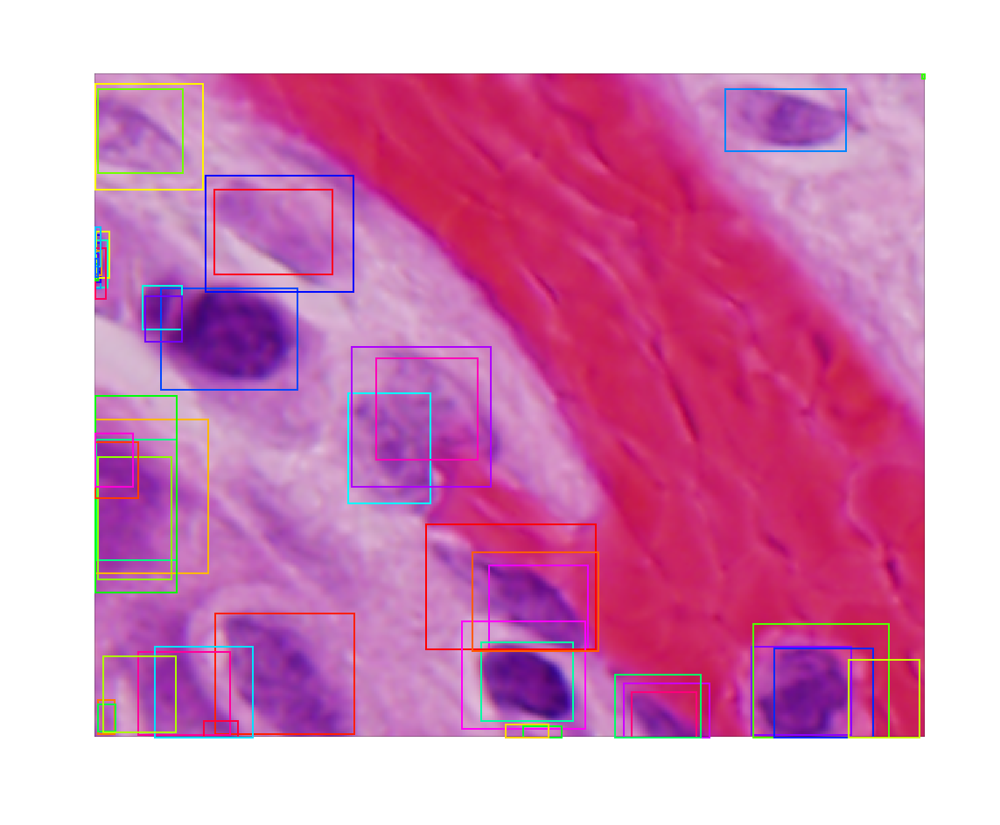

In [19]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
# h, w = config.IMAGE_SHAPE[:2]
# proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(
    image, ax=get_ax(),
    refined_boxes=utils.denorm_boxes(rpn['proposals'][0, :limit], image.shape[:2]))

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [20]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 2000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 2000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 2000, 2, 4)       min:   -3.47788  max:    3.38944  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00004  max:    0.99984  float32
detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32


19 detections: ['nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus']


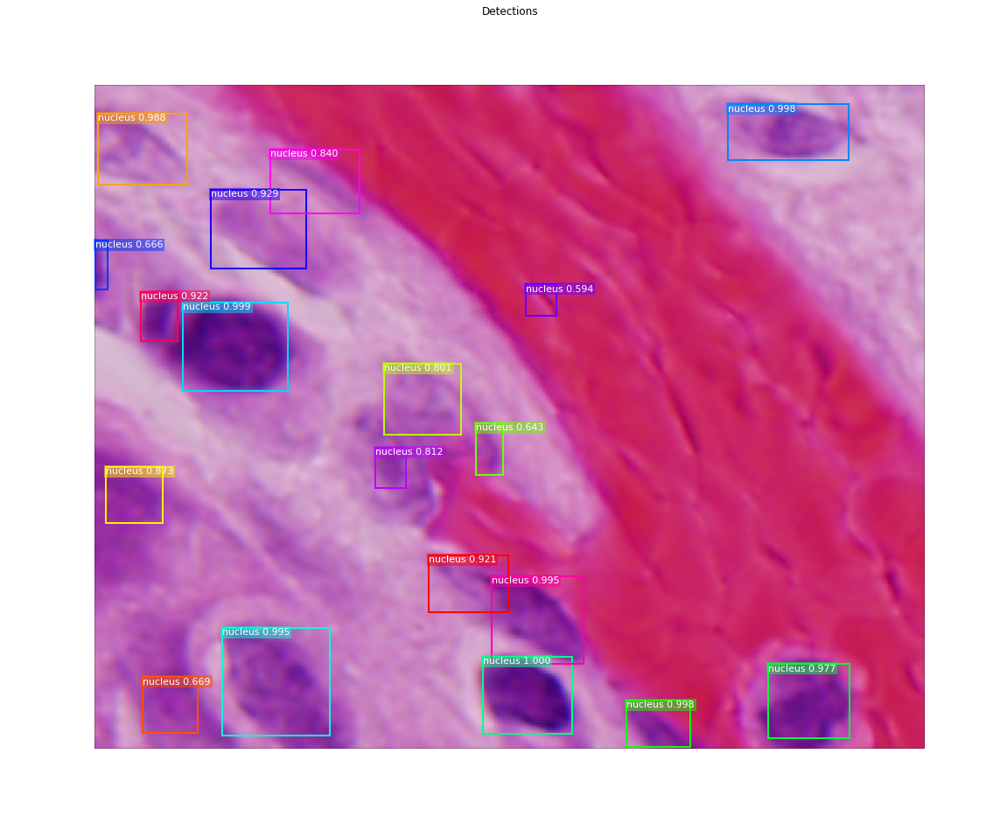

In [21]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [22]:
# Proposals are in normalized coordinates
proposals = mrcnn["proposals"][0]

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

2000 Valid proposals out of 2000
69 Positive ROIs
[('BG', 1931), ('nucleus', 69)]


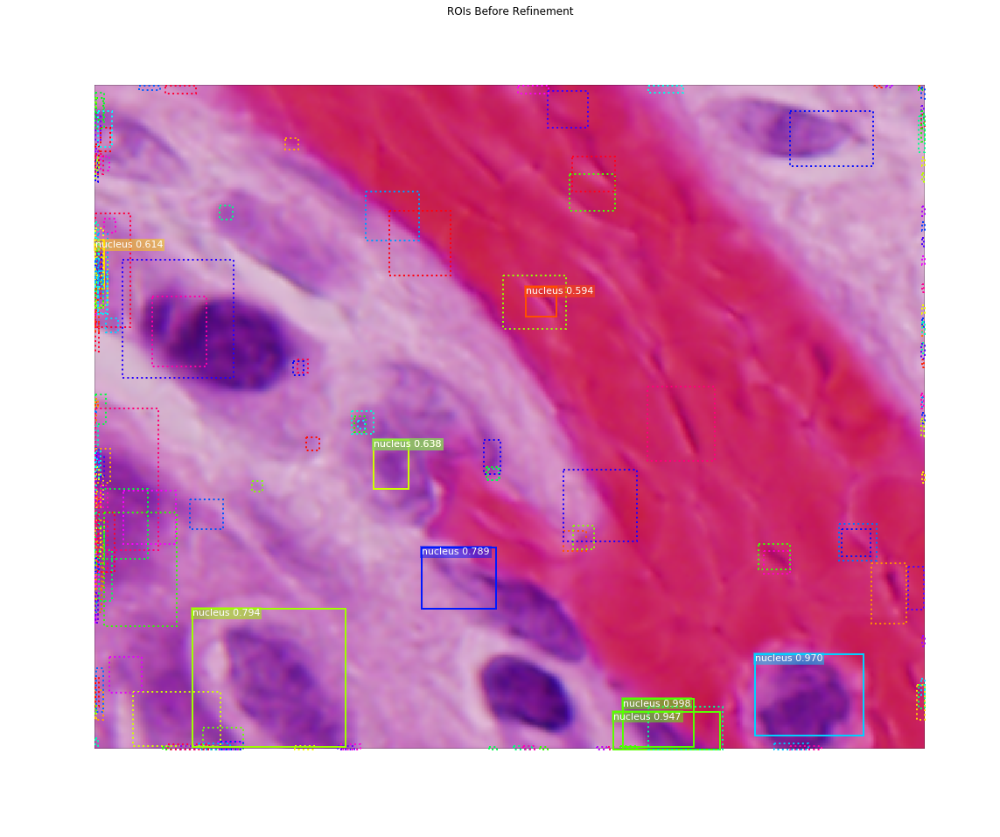

In [23]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
    captions=captions, title="ROIs Before Refinement",
    ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (2000, 4)             min:   -2.55332  max:    3.38944  float32
refined_proposals        shape: (2000, 4)             min:   -0.00621  max:    1.06598  float32


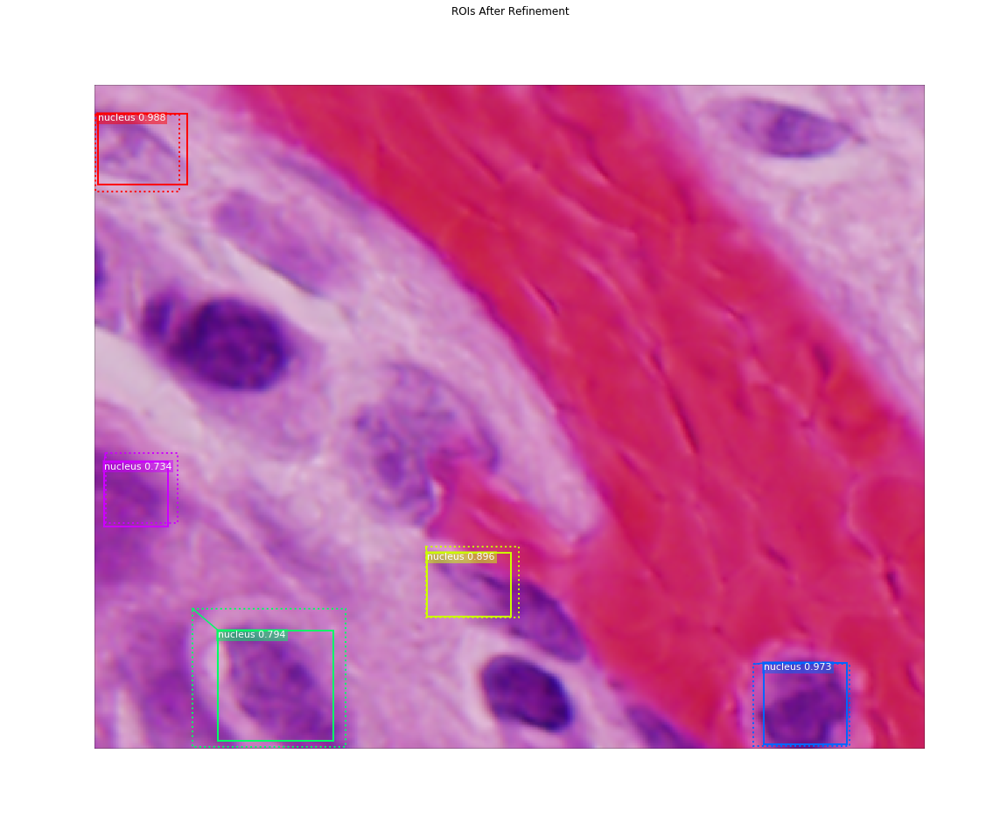

In [24]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=utils.denorm_boxes(proposals[roi_positive_ixs][ids], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[roi_positive_ixs][ids], image.shape[:2]),
    visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
    captions=captions, title="ROIs After Refinement")

#### Filter Low Confidence Detections

In [25]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 69 detections:
[   0    1    2    3    4    5    6    7    8    9   10   12   13   16
   17   19   21   24   29   37   39   44   47   50   53   54   58   69
   70   77   85   87  117  123  125  126  128  133  148  158  187  198
  214  221  243  255  259  269  282  318  354  476  662  705  770  812
  885  971  980 1048 1073 1143 1211 1366 1378 1481 1483 1893 1914]


In [26]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0 confidence. Keep 69:
[   0    1    2    3    4    5    6    7    8    9   10   12   13   16
   17   19   21   24   29   37   39   44   47   50   53   54   58   69
   70   77   85   87  117  123  125  126  128  133  148  158  187  198
  214  221  243  255  259  269  282  318  354  476  662  705  770  812
  885  971  980 1048 1073 1143 1211 1366 1378 1481 1483 1893 1914]


#### Per-Class Non-Max Suppression

In [27]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

nucleus               : [   0    1    2    3    4    5    6    7    8    9   10   12   13   16
   17   19   21   24   29   37   39   44   47   50   53   54   58   69
   70   77   85   87  117  123  125  126  128  133  148  158  187  198
  214  221  243  255  259  269  282  318  354  476  662  705  770  812
  885  971  980 1048 1073 1143 1211 1366 1378 1481 1483 1893 1914] -> [  13    8    0    4    3    9  318   85   12    2   54   44  126   19
   50   47 1914   29  133]

Kept after per-class NMS: 19
[   0    2    3    4    8    9   12   13   19   29   44   47   50   54
   85  126  133  318 1914]


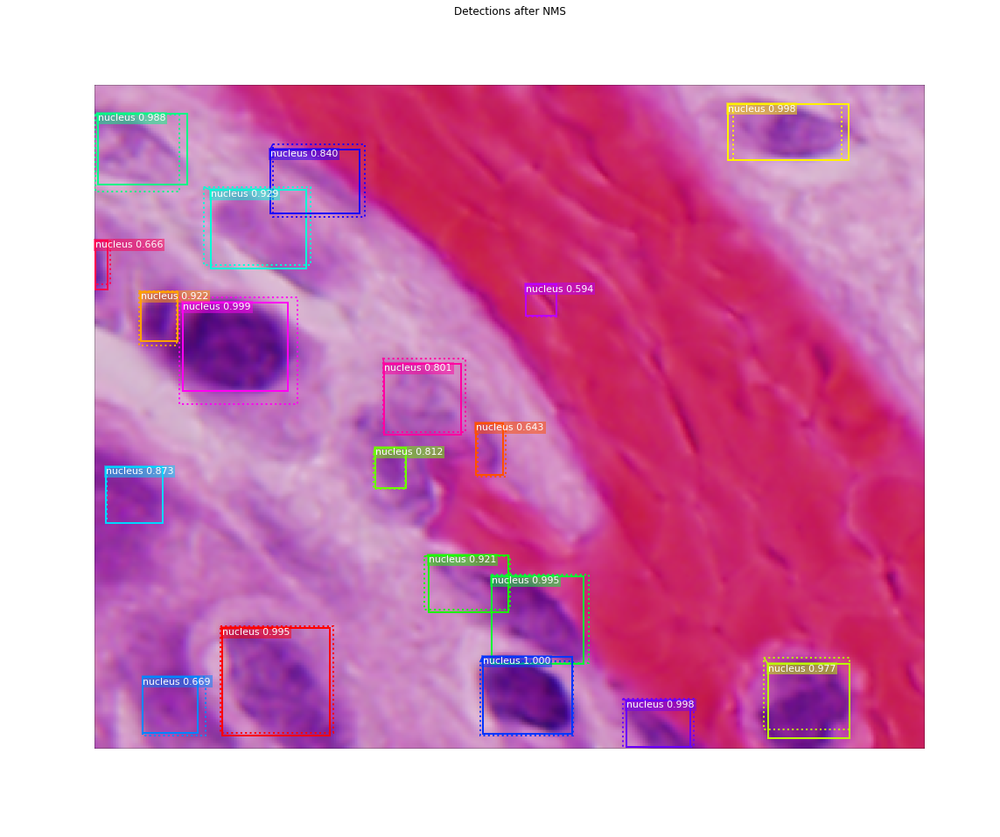

In [28]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[keep][ixs], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[keep][ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

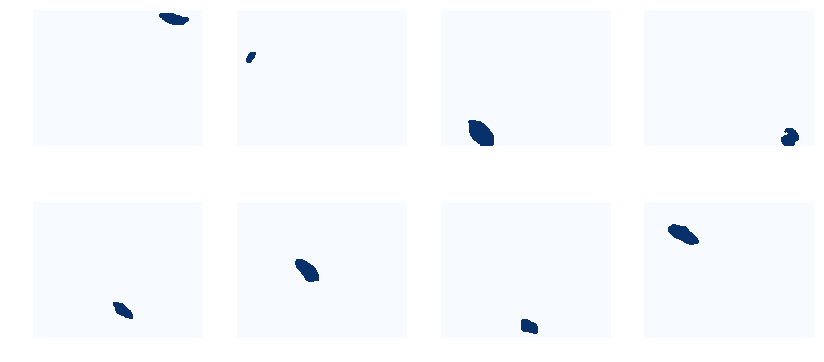

In [29]:
limit = 8
display_images(np.transpose(gt_mask[..., :limit], [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [30]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00004  max:    0.99984  float32
19 detections: ['nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus'
 'nucleus' 'nucleus' 'nucleus' 'nucleus' 'nucleus']


In [31]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (19, 28, 28)          min:    0.00004  max:    0.99984  float32
det_masks                shape: (19, 512, 640)        min:    0.00000  max:    1.00000  bool


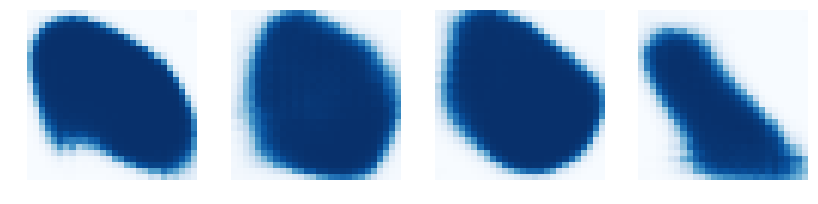

In [32]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

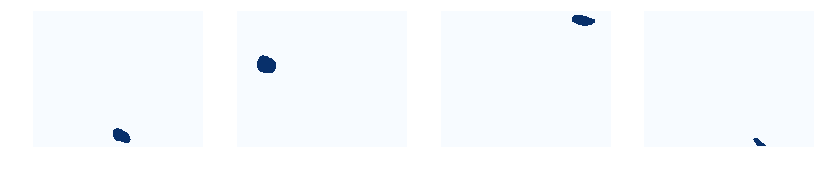

In [33]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [34]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1280, 3)    min:  -38.56000  max:  184.47000  float32
res2c_out                shape: (1, 256, 320, 256)    min:    0.00000  max:   18.96384  float32
res3c_out                shape: (1, 128, 160, 512)    min:    0.00000  max:   14.29902  float32
rpn_bbox                 shape: (1, 327360, 4)        min:  -14.41855  max:   60.67371  float32
roi                      shape: (1, 2000, 4)          min:    0.00000  max:    1.00000  float32


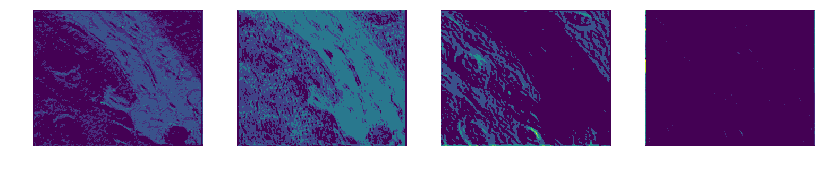

In [35]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)